In [1]:
import os
import json
import pandas as pd
while os.getcwd() != '/home/jupyter/crisp':
    os.chdir("..")
%pwd

'/home/jupyter/crisp'

In [2]:
from main import run
from nasa_mice.functions import generate_mouse_human_experiment

In [14]:
verbose = 0
output_data_regime = 'binary' #'real-valued'

In [4]:
data = pd.read_pickle('data/cosmic_rads/human_mice_data_combined.pkl')

In [5]:
data['Characteristics[organism]'].value_counts()

Mus musculus    41
Homo sapiens    21
Name: Characteristics[organism], dtype: int64

In [6]:
max_humans = 21
max_mice = 41

In [7]:
for mice in range(0,41,2):
    generate_mouse_human_experiment(filepath='data/cosmic_rads/human_mice_data_combined.pkl',
                                    human_count = max_humans,
                                    mice_count = mice,
                                    seed = 42,
                                    pickle_directory = 'data/cosmic_rads/vary_mice',
                                    organism_column = 'Characteristics[organism]')

<AxesSubplot:>

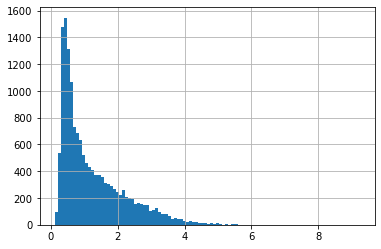

In [8]:
data.std().hist(bins=100)

In [9]:
(data.std() > 2).value_counts()

False    12349
True      3000
dtype: int64

In [10]:
# for experiment in os.listdir('data/cosmic_rads/vary_mice'):
#     if experiment.endswith('.pkl'):
#         print(experiment)
#         merged_data_columns = pd.read_pickle('data/cosmic_rads/vary_mice/'+experiment).columns
#         try:
#             os.mkdir('results/cosmic_rads/vary_mice/'+experiment[:-4]+'/')
#         except Exception as e:
#             print(e)

#         # define config
#         config = {
#             "name": "Example Experiment for AH casual ensemble",
#             "short_name": "ah_experiment_notebook",
#             "bucket_project": "fdl-us-astronaut-health",
#             "bucket_name": "ah_21_data",
#             "bucket_path": "gs://ah_21_data",
#             "verbose": verbose,
#             "test_val_split": [0.1, 0.1],
#             "per_variant_experiment": False,
#             "data_options": {
#                 'synthetic_train_test_split' : False,
#                 'dataset_fp' : 'data/cosmic_rads/vary_mice/'+experiment,
#                 'output_data_regime' : output_data_regime,
#                 'subject_keys': 'Source Name',
#                 'targets': ['irradiated'], #['dose_Gy'],
#                 'predictors': list(data.columns[43:-4]),
#                 'environments': ['environment'],
#                 'exclude': ['organism', 'source', 'gender', 'age_years', 'timepoint_hr', 'dose_Gy', 'radiation', 'dataset','strain']
#             },
#             "feature_selection_options": {
#                 "max_features": 20,
#                 "verbose": verbose,
#                 "seed": 12,
#                 "variance_threshold" : 2, # actually std
#             },
#             "ensemble_options": {
#                 "models": ["IRM","LIRM"],#, "ICP",], # "DCF", "LIRM", "NLICP"],
#                 "LIRM" : {
#                     "use_icp_initialization": False,
#                     "verbose": verbose,
#                     "n_iterations": 1000,
#                     "seed": 0,
#                     "lr": 0.001,
#                     "cuda": False,
#                     "output_data_regime" : output_data_regime,
#                 },
#                 "DCF" : {
#                     "minP": 0.1,
#                     "maxP": 0.9,
#                     "minFeatures": 1,
#                     "minAccuracy": 0.5,
#                     "seed": 0,
#                     "verbose": verbose,
#                     "target": ["Target"],
#                     "output_pvals": False,
#                     "output_data_regime" : output_data_regime,
#                 },
#                 "NLICP" : {
#                     "max_set_size": 2,
#                     "alpha": 0.05,
#                     "seed": 12,
#                     "verbose": verbose,
#                     "method": "MLP",
#                     "hidden_dim": 256,
#                     "output_data_regime" : output_data_regime,
#                 },
#                 "LICP" : {
#                     "max_set_size": 2,
#                     "alpha": 0.05,
#                     "seed": 12,
#                     "verbose": verbose,
#                     "output_data_regime" : output_data_regime,
#                 },
#             },
#              "use_cloud":False,
#             "results_directory": "results/cosmic_rads/vary_mice/"+experiment[:-4]+'/'
#             }
#         print(config['results_directory'])
#         run(config)

In [11]:
for humans in range(0,max_humans,1):
    generate_mouse_human_experiment(filepath='data/cosmic_rads/human_mice_data_combined.pkl',
                                    human_count = humans,
                                    mice_count = max_mice,
                                    seed = 42,
                                    pickle_directory = 'data/cosmic_rads/vary_humans',
                                    organism_column = 'Characteristics[organism]')

humans_1_mice_41_seed_42.pkl
[Errno 17] File exists: 'results/cosmic_rads/vary_humans/humans_1_mice_41_seed_42/'
results/cosmic_rads/vary_humans/humans_1_mice_41_seed_42/
Running Ensemble with the following models:  ['IRM', 'LIRM']


/home/jupyter/crisp/utils/CorrelationToTarget.py:24: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  all_x = np.array(all_x)
/home/jupyter/crisp/utils/CorrelationToTarget.py:25: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  all_y = np.array(all_y)


Checking for features with zero variance
variance threshold is 2
Running correlation analysis
Running Linear IRM
Start IRM training procedure with binary target
Finished Linear IRM
Running IRM
NLIRM using deep MLP2
0               0.82494         0.65146         0.19805      
100             0.64859         0.81520         0.02743      
200             0.66040         0.46433         0.00202      
300             0.71287         0.32749         0.00145      
400             0.67319         0.72632         0.00032      
500             0.67337         0.60702         0.00113      
600             0.70999         0.31813         0.00088      
700             0.69930         0.57544         0.00109      
800             0.68791         0.37544         8.99518e-05  
900             0.69071         0.41520         0.00038      
Finished IRM
Processing Linear IRM
Processing Non-Linear IRM
humans_0_mice_41_seed_42.pkl
[Errno 17] File exists: 'results/cosmic_rads/vary_humans/humans_0_mice_41_s

/home/jupyter/crisp/utils/CorrelationToTarget.py:24: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  all_x = np.array(all_x)
/home/jupyter/crisp/utils/CorrelationToTarget.py:25: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  all_y = np.array(all_y)


Checking for features with zero variance
variance threshold is 2
Running correlation analysis
Running Linear IRM
Start IRM training procedure with binary target
Finished Linear IRM
Running IRM
NLIRM using deep MLP2
0               1.13151         0.50351         0.48672      
100             0.66546         0.72807         0.00790      
200             0.66417         0.76140         0.00129      
300             0.65128         0.64912         0.00069      
400             0.70096         0.62982         0.00332      
500             0.68069         0.57018         0.00012      
600             0.63567         0.65614         0.00203      
700             0.64776         0.72281         0.00248      
800             0.68813         0.49649         7.25957e-06  
900             0.64522         0.64912         0.00184      
Finished IRM
Processing Linear IRM
Processing Non-Linear IRM
humans_18_mice_41_seed_42.pkl
[Errno 17] File exists: 'results/cosmic_rads/vary_humans/humans_18_mice_41

/home/jupyter/crisp/utils/CorrelationToTarget.py:24: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  all_x = np.array(all_x)
/home/jupyter/crisp/utils/CorrelationToTarget.py:25: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  all_y = np.array(all_y)


Checking for features with zero variance
variance threshold is 2
Running correlation analysis
Running Linear IRM
Start IRM training procedure with binary target
Finished Linear IRM
Running IRM
NLIRM using deep MLP2
0               2.18998         0.59679         3.90532      
100             0.78018         0.65994         0.12686      
200             0.65013         0.67244         0.00107      
300             0.66389         0.60865         0.00046      
400             0.64029         0.76538         0.00296      
500             0.68540         0.66282         4.88359e-05  
600             0.68135         0.66282         0.00014      
700             0.67699         0.73974         0.00040      
800             0.68805         0.71410         2.78091e-05  
900             0.68914         0.73974         1.66592e-05  
Finished IRM
Processing Linear IRM
Processing Non-Linear IRM
humans_13_mice_41_seed_42.pkl
[Errno 17] File exists: 'results/cosmic_rads/vary_humans/humans_13_mice_41

/home/jupyter/crisp/utils/CorrelationToTarget.py:24: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  all_x = np.array(all_x)
/home/jupyter/crisp/utils/CorrelationToTarget.py:25: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  all_y = np.array(all_y)


Checking for features with zero variance
variance threshold is 2
Running correlation analysis
Running Linear IRM
Start IRM training procedure with binary target
Finished Linear IRM
Running IRM
NLIRM using deep MLP2
0               3.38673         0.64298         11.21407     
100             0.73274         0.53311         0.01691      
200             0.67427         0.65724         0.00017      
300             0.69468         0.67478         0.00019      
400             0.69256         0.64145         4.23759e-05  
500             0.68659         0.70811         4.56092e-05  
600             0.68781         0.74145         3.09499e-05  
700             0.69013         0.70811         9.37027e-06  
800             0.69083         0.70811         7.25839e-06  
900             0.69000         0.70811         9.90846e-06  
Finished IRM
Processing Linear IRM
Processing Non-Linear IRM
humans_7_mice_41_seed_42.pkl
[Errno 17] File exists: 'results/cosmic_rads/vary_humans/humans_7_mice_41_s

/home/jupyter/crisp/utils/CorrelationToTarget.py:24: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  all_x = np.array(all_x)
/home/jupyter/crisp/utils/CorrelationToTarget.py:25: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  all_y = np.array(all_y)


Checking for features with zero variance
variance threshold is 2
Running correlation analysis
Running Linear IRM
Start IRM training procedure with binary target
Finished Linear IRM
Running IRM
NLIRM using deep MLP2
0               3.27801         0.43943         11.00910     
100             1.30017         0.60196         1.22910      
200             0.56103         0.66645         0.00306      
300             0.64820         0.68715         0.00264      
400             0.63399         0.67386         0.00173      
500             0.64914         0.74270         0.00261      
600             0.64447         0.74270         0.00300      
700             0.68142         0.74270         0.00017      
800             0.68098         0.74270         0.00022      
900             0.68577         0.74270         6.77166e-05  
Finished IRM
Processing Linear IRM
Processing Non-Linear IRM
humans_17_mice_41_seed_42.pkl
[Errno 17] File exists: 'results/cosmic_rads/vary_humans/humans_17_mice_41

/home/jupyter/crisp/utils/CorrelationToTarget.py:24: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  all_x = np.array(all_x)
/home/jupyter/crisp/utils/CorrelationToTarget.py:25: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  all_y = np.array(all_y)


Checking for features with zero variance
variance threshold is 2
Running correlation analysis
Running Linear IRM
Start IRM training procedure with binary target
Finished Linear IRM
Running IRM
NLIRM using deep MLP2
0               3.45379         0.49405         13.07682     
100             0.75049         0.57639         0.03156      
200             0.64423         0.65146         0.00296      
300             0.66515         0.71032         0.00062      
400             0.67898         0.72652         0.00025      
500             0.67954         0.72652         0.00031      
600             0.68893         0.72652         1.97735e-05  
700             0.68941         0.72652         1.46155e-05  
800             0.69032         0.72652         7.94666e-06  
900             0.69107         0.72652         4.28644e-06  
Finished IRM
Processing Linear IRM
Processing Non-Linear IRM
humans_10_mice_41_seed_42.pkl
[Errno 17] File exists: 'results/cosmic_rads/vary_humans/humans_10_mice_41

/home/jupyter/crisp/utils/CorrelationToTarget.py:24: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  all_x = np.array(all_x)
/home/jupyter/crisp/utils/CorrelationToTarget.py:25: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  all_y = np.array(all_y)


Checking for features with zero variance
variance threshold is 2
Running correlation analysis
Running Linear IRM
Start IRM training procedure with binary target
Finished Linear IRM
Running IRM
NLIRM using deep MLP2
0               3.71041         0.40106         14.61437     
100             0.65831         0.59418         0.00902      
200             0.68190         0.67513         0.00058      
300             0.66143         0.62116         0.00249      
400             0.68118         0.62698         0.00015      
500             0.67707         0.71746         0.00033      
600             0.68201         0.71746         0.00014      
700             0.68429         0.71746         8.20799e-05  
800             0.68744         0.71746         3.27011e-05  
900             0.68901         0.71746         1.67477e-05  
Finished IRM
Processing Linear IRM
Processing Non-Linear IRM
humans_5_mice_41_seed_42.pkl
[Errno 17] File exists: 'results/cosmic_rads/vary_humans/humans_5_mice_41_s

/home/jupyter/crisp/utils/CorrelationToTarget.py:24: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  all_x = np.array(all_x)
/home/jupyter/crisp/utils/CorrelationToTarget.py:25: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  all_y = np.array(all_y)


Checking for features with zero variance
variance threshold is 2
Running correlation analysis
Running Linear IRM
Start IRM training procedure with binary target
Finished Linear IRM
Running IRM
NLIRM using deep MLP2
0               2.19226         0.58875         4.56061      
100             0.53123         0.81631         0.10085      
200             0.38692         0.79670         0.00064      
300             0.40728         0.81631         0.00069      
400             0.45277         0.81631         0.00593      
500             0.45012         0.81631         0.00038      
600             0.41546         0.81631         0.00058      
700             0.40073         0.79876         0.00207      
800             0.41492         0.79876         0.00278      
900             0.43437         0.81631         0.00041      
Finished IRM
Processing Linear IRM
Processing Non-Linear IRM
humans_19_mice_41_seed_42.pkl
[Errno 17] File exists: 'results/cosmic_rads/vary_humans/humans_19_mice_41

/home/jupyter/crisp/utils/CorrelationToTarget.py:24: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  all_x = np.array(all_x)
/home/jupyter/crisp/utils/CorrelationToTarget.py:25: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  all_y = np.array(all_y)


Checking for features with zero variance
variance threshold is 2
Running correlation analysis
Running Linear IRM
Start IRM training procedure with binary target
Finished Linear IRM
Running IRM
NLIRM using deep MLP2
0               3.15064         0.60458         11.02445     
100             0.65957         0.64488         0.00731      
200             0.67698         0.72954         0.00027      
300             0.68343         0.72954         9.76179e-05  
400             0.68497         0.72954         7.24051e-05  
500             0.68647         0.72954         4.80297e-05  
600             0.68753         0.72954         3.44329e-05  
700             0.68851         0.72954         2.30636e-05  
800             0.68918         0.72954         1.70981e-05  
900             0.68967         0.72954         1.30798e-05  
Finished IRM
Processing Linear IRM
Processing Non-Linear IRM
humans_2_mice_41_seed_42.pkl
[Errno 17] File exists: 'results/cosmic_rads/vary_humans/humans_2_mice_41_s

/home/jupyter/crisp/utils/CorrelationToTarget.py:24: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  all_x = np.array(all_x)
/home/jupyter/crisp/utils/CorrelationToTarget.py:25: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  all_y = np.array(all_y)


Checking for features with zero variance
variance threshold is 2
Running correlation analysis
Running Linear IRM
Start IRM training procedure with binary target
Finished Linear IRM
Running IRM
NLIRM using deep MLP2
0               2.78064         0.59524         10.37361     
100             0.42111         0.71429         0.00562      
200             0.60477         0.69841         0.02221      
300             0.43025         0.77778         0.00154      
400             0.45696         0.75397         0.00592      
500             0.41114         0.72222         0.00085      
600             0.46519         0.77778         0.01208      
700             0.42325         0.74603         0.00020      
800             0.42249         0.77778         0.00220      
900             0.41893         0.77778         0.00138      
Finished IRM
Processing Linear IRM
Processing Non-Linear IRM
humans_16_mice_41_seed_42.pkl
[Errno 17] File exists: 'results/cosmic_rads/vary_humans/humans_16_mice_41

/home/jupyter/crisp/utils/CorrelationToTarget.py:24: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  all_x = np.array(all_x)
/home/jupyter/crisp/utils/CorrelationToTarget.py:25: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  all_y = np.array(all_y)


Checking for features with zero variance
variance threshold is 2
Running correlation analysis
Running Linear IRM
Start IRM training procedure with binary target
Finished Linear IRM
Running IRM
NLIRM using deep MLP2
0               5.51941         0.29701         29.49623     
100             0.64170         0.74003         0.00148      
200             0.66049         0.62197         0.00052      
300             0.65403         0.70068         0.00181      
400             0.66320         0.67504         0.00126      
500             0.68054         0.75196         0.00017      
600             0.68221         0.72632         0.00011      
700             0.68863         0.67504         2.37719e-05  
800             0.68792         0.70068         2.66711e-05  
900             0.68888         0.70068         1.79512e-05  
Finished IRM
Processing Linear IRM


/home/jupyter/crisp/utils/plotting.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1, figsize=(50, 30))


Processing Non-Linear IRM
humans_3_mice_41_seed_42.pkl
[Errno 17] File exists: 'results/cosmic_rads/vary_humans/humans_3_mice_41_seed_42/'
results/cosmic_rads/vary_humans/humans_3_mice_41_seed_42/
Running Ensemble with the following models:  ['IRM', 'LIRM']


/home/jupyter/crisp/utils/CorrelationToTarget.py:24: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  all_x = np.array(all_x)
/home/jupyter/crisp/utils/CorrelationToTarget.py:25: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  all_y = np.array(all_y)


Checking for features with zero variance
variance threshold is 2
Running correlation analysis
Running Linear IRM
Start IRM training procedure with binary target
Finished Linear IRM
Running IRM
NLIRM using deep MLP2
0               1.55838         0.76157         3.38116      
100             0.40763         0.80556         0.00285      
200             0.37284         0.84259         0.00372      
300             0.40790         0.78472         0.00070      
400             0.40306         0.80556         0.00178      
500             0.38892         0.82407         0.00255      
600             0.42700         0.80324         0.00073      
700             0.40572         0.80324         0.00024      
800             0.44614         0.80324         0.00041      
900             0.42800         0.80324         0.00045      
Finished IRM
Processing Linear IRM
Processing Non-Linear IRM
humans_4_mice_41_seed_42.pkl
[Errno 17] File exists: 'results/cosmic_rads/vary_humans/humans_4_mice_41_s

/home/jupyter/crisp/utils/CorrelationToTarget.py:24: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  all_x = np.array(all_x)
/home/jupyter/crisp/utils/CorrelationToTarget.py:25: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  all_y = np.array(all_y)


Checking for features with zero variance
variance threshold is 2
Running correlation analysis
Running Linear IRM
Start IRM training procedure with binary target
Finished Linear IRM
Running IRM
NLIRM using deep MLP2
0               7.01401         0.30526         59.85537     
100             0.67787         0.65029         0.14740      
200             0.46894         0.71696         0.00036      
300             0.43865         0.74854         0.00345      
400             0.39155         0.85029         0.00215      
500             0.39702         0.80585         0.00146      
600             0.55010         0.67251         0.00449      
700             0.44428         0.82339         0.00291      
800             0.39442         0.82807         0.00681      
900             0.41205         0.76608         0.00163      
Finished IRM
Processing Linear IRM
Processing Non-Linear IRM
humans_12_mice_41_seed_42.pkl
[Errno 17] File exists: 'results/cosmic_rads/vary_humans/humans_12_mice_41

/home/jupyter/crisp/utils/CorrelationToTarget.py:24: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  all_x = np.array(all_x)
/home/jupyter/crisp/utils/CorrelationToTarget.py:25: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  all_y = np.array(all_y)


Checking for features with zero variance
variance threshold is 2
Running correlation analysis
Running Linear IRM
Start IRM training procedure with binary target
Finished Linear IRM
Running IRM
NLIRM using deep MLP2
0               3.68696         0.45833         15.54952     
100             0.59485         0.65278         0.00050      
200             0.66421         0.61111         0.00110      
300             0.70734         0.58333         0.00192      
400             0.69529         0.67361         0.00037      
500             0.68414         0.68056         0.00013      
600             0.68684         0.67361         5.93572e-05  
700             0.68932         0.67361         2.10495e-05  
800             0.69035         0.67361         1.11691e-05  
900             0.69258         0.67361         4.52371e-07  
Finished IRM
Processing Linear IRM
Processing Non-Linear IRM
humans_9_mice_41_seed_42.pkl
[Errno 17] File exists: 'results/cosmic_rads/vary_humans/humans_9_mice_41_s

/home/jupyter/crisp/utils/CorrelationToTarget.py:24: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  all_x = np.array(all_x)
/home/jupyter/crisp/utils/CorrelationToTarget.py:25: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  all_y = np.array(all_y)


Checking for features with zero variance
variance threshold is 2
Running correlation analysis
Running Linear IRM
Start IRM training procedure with binary target
Finished Linear IRM
Running IRM
NLIRM using deep MLP2
0               4.91436         0.33135         26.27830     
100             0.65768         0.73710         0.02470      
200             0.58076         0.66865         0.00250      
300             0.65497         0.58962         0.00063      
400             0.66106         0.68948         0.00014      
500             0.67737         0.64187         0.00154      
600             0.70930         0.64187         0.00974      
700             0.64173         0.68948         0.00254      
800             0.63370         0.71627         0.00315      
900             0.66919         0.64187         4.29773e-05  
Finished IRM
Processing Linear IRM
Processing Non-Linear IRM
humans_20_mice_41_seed_42.pkl
[Errno 17] File exists: 'results/cosmic_rads/vary_humans/humans_20_mice_41

/home/jupyter/crisp/utils/CorrelationToTarget.py:24: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  all_x = np.array(all_x)
/home/jupyter/crisp/utils/CorrelationToTarget.py:25: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  all_y = np.array(all_y)


Checking for features with zero variance
variance threshold is 2
Running correlation analysis
Running Linear IRM
Start IRM training procedure with binary target
Finished Linear IRM
Running IRM
NLIRM using deep MLP2
0               2.63612         0.58845         6.43182      
100             0.66649         0.55029         0.00158      
200             0.64083         0.66192         0.00210      
300             0.64303         0.72251         0.00236      
400             0.67355         0.72251         0.00028      
500             0.68464         0.70168         7.92469e-05  
600             0.68788         0.74335         2.83811e-05  
700             0.68838         0.74335         2.38013e-05  
800             0.68964         0.74335         1.21641e-05  
900             0.69019         0.74335         8.67272e-06  
Finished IRM
Processing Linear IRM
Processing Non-Linear IRM
humans_14_mice_41_seed_42.pkl
[Errno 17] File exists: 'results/cosmic_rads/vary_humans/humans_14_mice_41

/home/jupyter/crisp/utils/CorrelationToTarget.py:24: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  all_x = np.array(all_x)
/home/jupyter/crisp/utils/CorrelationToTarget.py:25: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  all_y = np.array(all_y)


Checking for features with zero variance
variance threshold is 2
Running correlation analysis
Running Linear IRM
Start IRM training procedure with binary target
Finished Linear IRM
Running IRM
NLIRM using deep MLP2
0               2.49859         0.58944         5.58018      
100             0.59411         0.68013         0.00393      
200             0.58942         0.75210         0.00703      
300             0.67245         0.63089         0.00014      
400             0.63386         0.69150         0.00136      
500             0.66218         0.72180         0.00171      
600             0.68881         0.75210         3.53270e-05  
700             0.69127         0.75210         4.32467e-06  
800             0.69140         0.75210         4.01204e-06  
900             0.69165         0.78241         2.97121e-06  
Finished IRM
Processing Linear IRM
Processing Non-Linear IRM
humans_8_mice_41_seed_42.pkl
[Errno 17] File exists: 'results/cosmic_rads/vary_humans/humans_8_mice_41_s

/home/jupyter/crisp/utils/CorrelationToTarget.py:24: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  all_x = np.array(all_x)
/home/jupyter/crisp/utils/CorrelationToTarget.py:25: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  all_y = np.array(all_y)


Checking for features with zero variance
variance threshold is 2
Running correlation analysis
Running Linear IRM
Start IRM training procedure with binary target
Finished Linear IRM
Running IRM
NLIRM using deep MLP2
0               9.02450         0.30608         93.32345     
100             0.84651         0.55075         0.14276      
200             0.72915         0.59774         0.08139      
300             0.73620         0.57300         0.00668      
400             0.72625         0.55013         0.00773      
500             0.67426         0.63315         0.00108      
600             0.64584         0.60934         0.00184      
700             0.69278         0.70990         0.00432      
800             0.67433         0.60871         0.00038      
900             0.68417         0.73371         5.26072e-05  
Finished IRM
Processing Linear IRM
Processing Non-Linear IRM
humans_11_mice_41_seed_42.pkl
[Errno 17] File exists: 'results/cosmic_rads/vary_humans/humans_11_mice_41

/home/jupyter/crisp/utils/CorrelationToTarget.py:24: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  all_x = np.array(all_x)
/home/jupyter/crisp/utils/CorrelationToTarget.py:25: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  all_y = np.array(all_y)


Checking for features with zero variance
variance threshold is 2
Running correlation analysis
Running Linear IRM
Start IRM training procedure with binary target
Finished Linear IRM
Running IRM
NLIRM using deep MLP2
0               3.08708         0.48485         8.62669      
100             0.67796         0.60795         0.00330      
200             0.69703         0.67045         0.00033      
300             0.67187         0.72159         0.00048      
400             0.68703         0.69129         3.79546e-05  
500             0.68797         0.69129         2.58176e-05  
600             0.68928         0.69129         1.65229e-05  
700             0.68880         0.72159         1.86489e-05  
800             0.69009         0.69129         1.06679e-05  
900             0.69051         0.69129         7.62532e-06  
Finished IRM
Processing Linear IRM
Processing Non-Linear IRM
humans_6_mice_41_seed_42.pkl
[Errno 17] File exists: 'results/cosmic_rads/vary_humans/humans_6_mice_41_s

/home/jupyter/crisp/utils/CorrelationToTarget.py:24: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  all_x = np.array(all_x)
/home/jupyter/crisp/utils/CorrelationToTarget.py:25: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  all_y = np.array(all_y)


Checking for features with zero variance
variance threshold is 2
Running correlation analysis
Running Linear IRM
Start IRM training procedure with binary target
Finished Linear IRM
Running IRM
NLIRM using deep MLP2
0               3.59880         0.57475         14.83860     
100             0.69114         0.59436         0.03403      
200             0.66267         0.62091         0.00057      
300             0.70547         0.47753         0.00419      
400             0.65176         0.74346         0.00132      
500             0.69260         0.47876         0.00020      
600             0.67404         0.62786         0.00056      
700             0.69460         0.54657         4.01568e-05  
800             0.69831         0.45670         6.23314e-05  
900             0.69202         0.41503         1.24480e-06  
Finished IRM
Processing Linear IRM
Processing Non-Linear IRM
humans_15_mice_41_seed_42.pkl
[Errno 17] File exists: 'results/cosmic_rads/vary_humans/humans_15_mice_41

/home/jupyter/crisp/utils/CorrelationToTarget.py:24: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  all_x = np.array(all_x)
/home/jupyter/crisp/utils/CorrelationToTarget.py:25: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  all_y = np.array(all_y)


Checking for features with zero variance
variance threshold is 2
Running correlation analysis
Running Linear IRM
Start IRM training procedure with binary target
Finished Linear IRM
Running IRM
NLIRM using deep MLP2
0               4.51570         0.41667         22.81357     
100             0.71137         0.53922         0.00664      
200             0.68528         0.59804         0.00131      
300             0.67707         0.67320         0.00019      
400             0.68457         0.72059         7.26880e-05  
500             0.68813         0.72059         2.61265e-05  
600             0.68861         0.72059         2.10776e-05  
700             0.69006         0.72059         9.36823e-06  
800             0.68994         0.72059         1.15284e-05  
900             0.68975         0.72059         1.23911e-05  
Finished IRM
Processing Linear IRM
Processing Non-Linear IRM


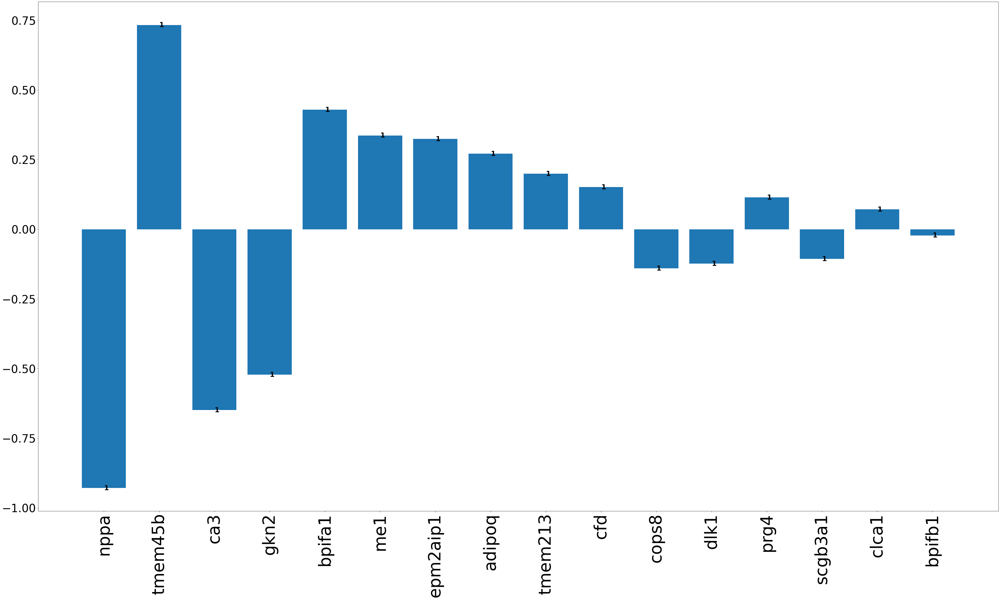

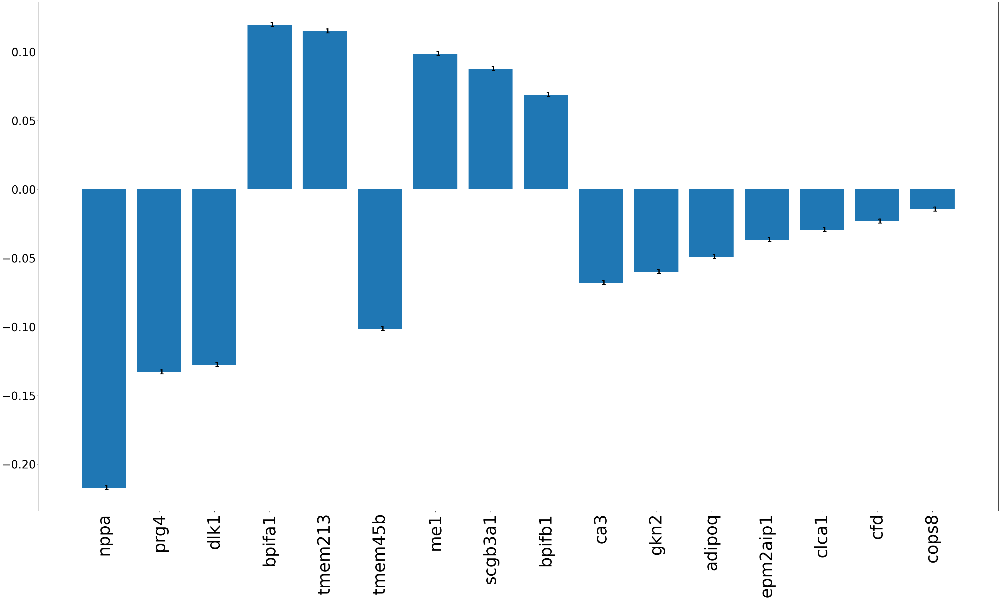

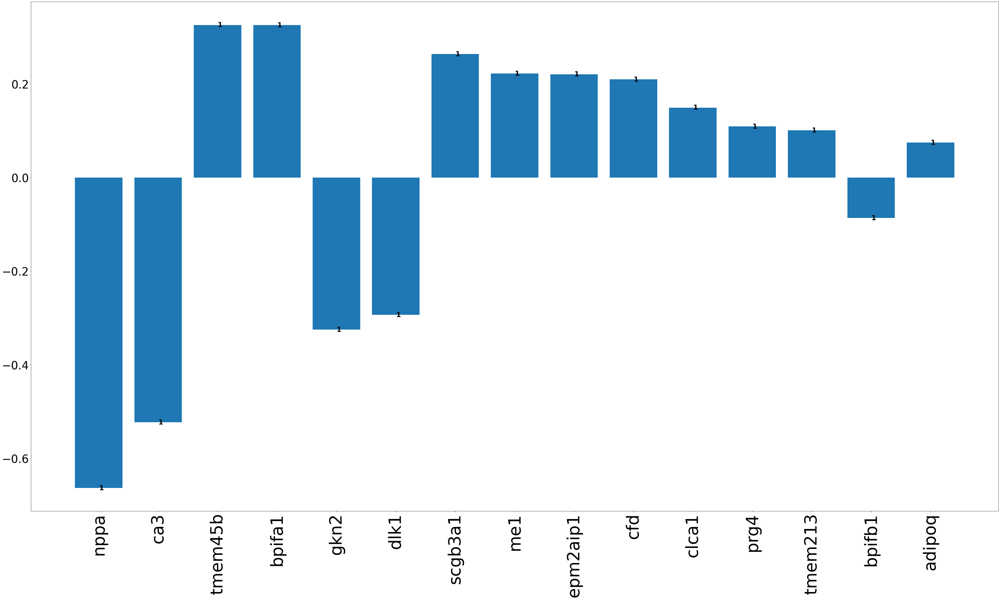

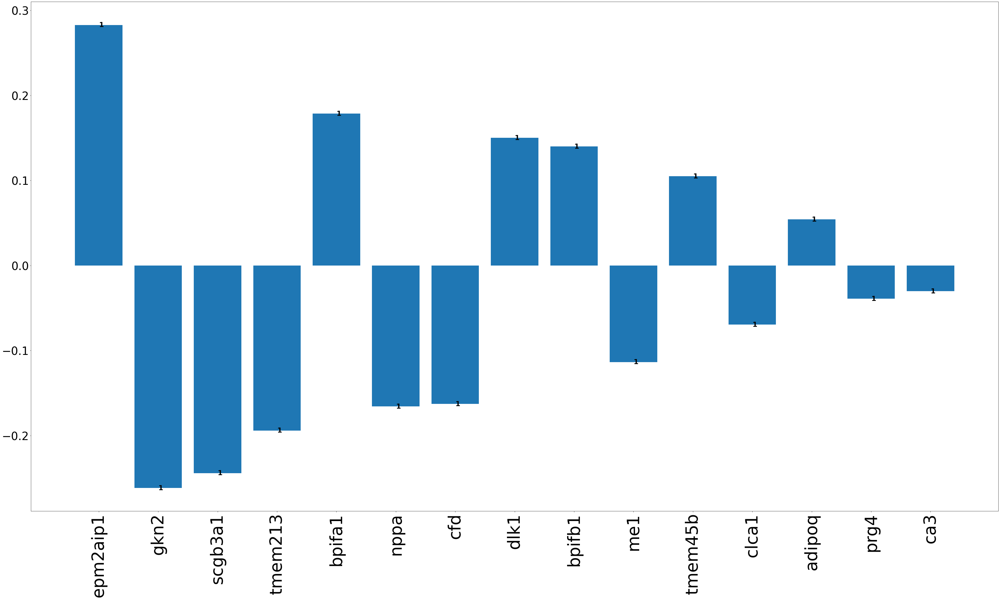

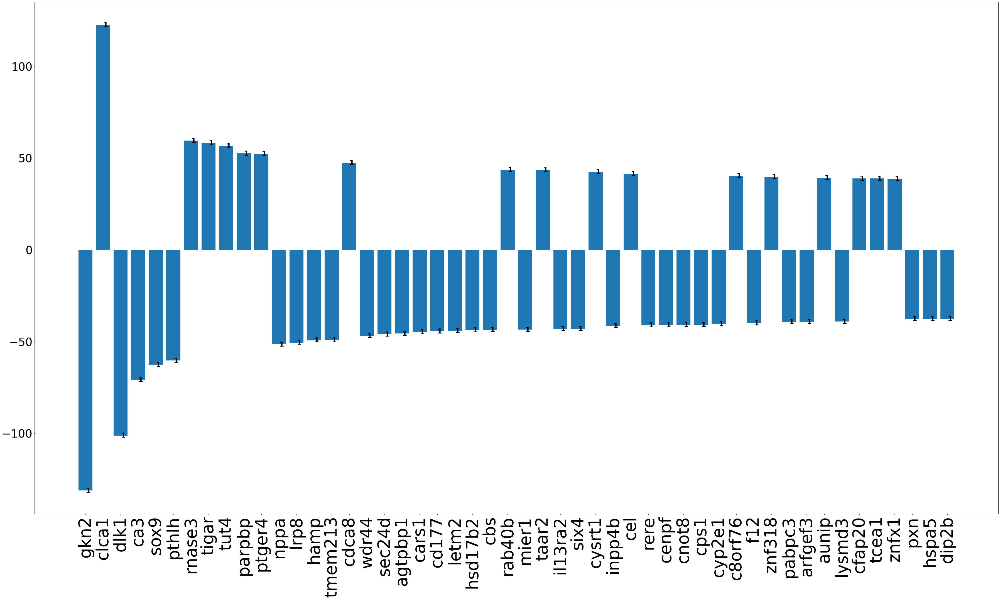

...

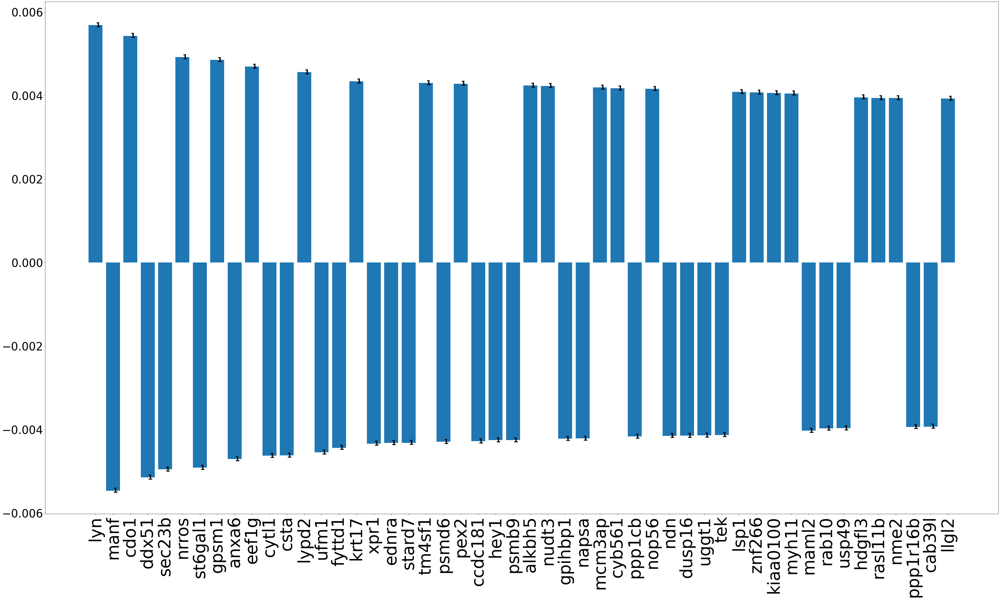

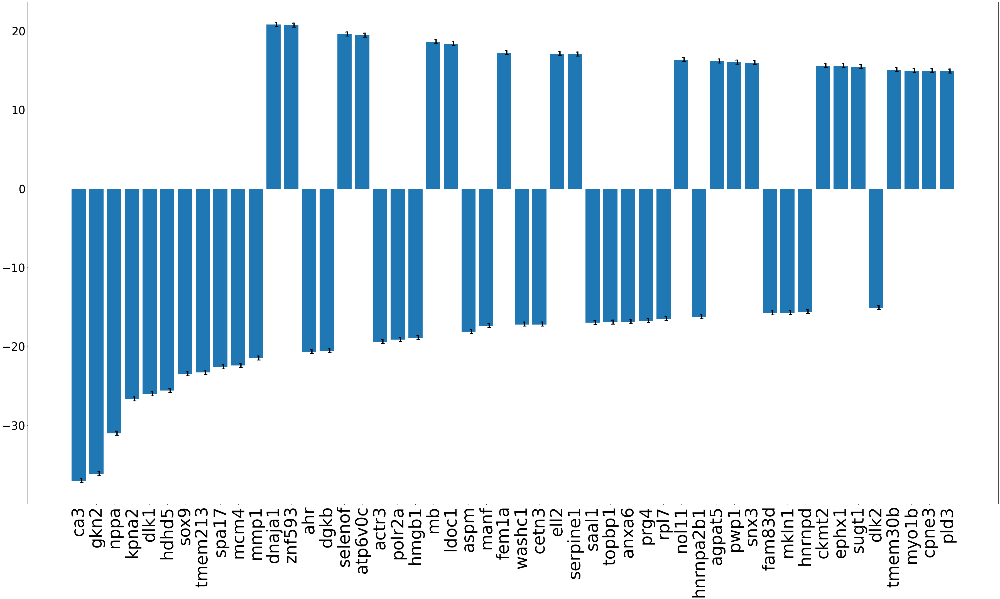

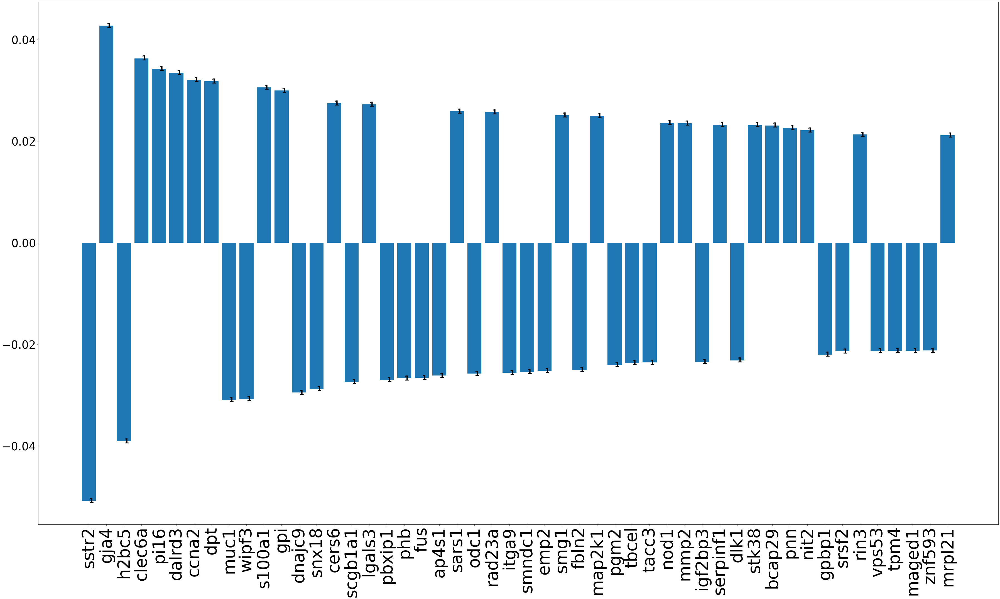

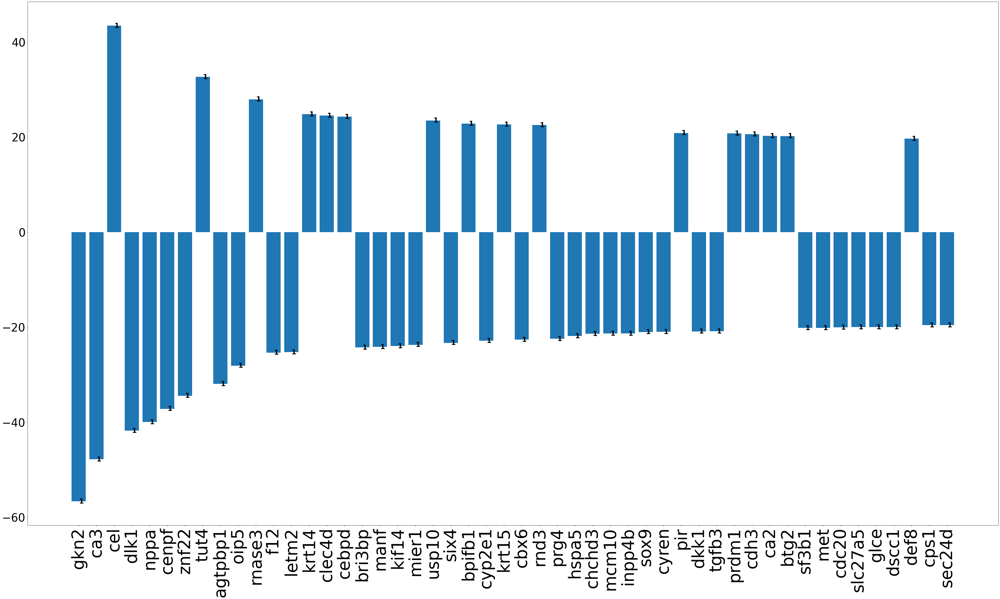

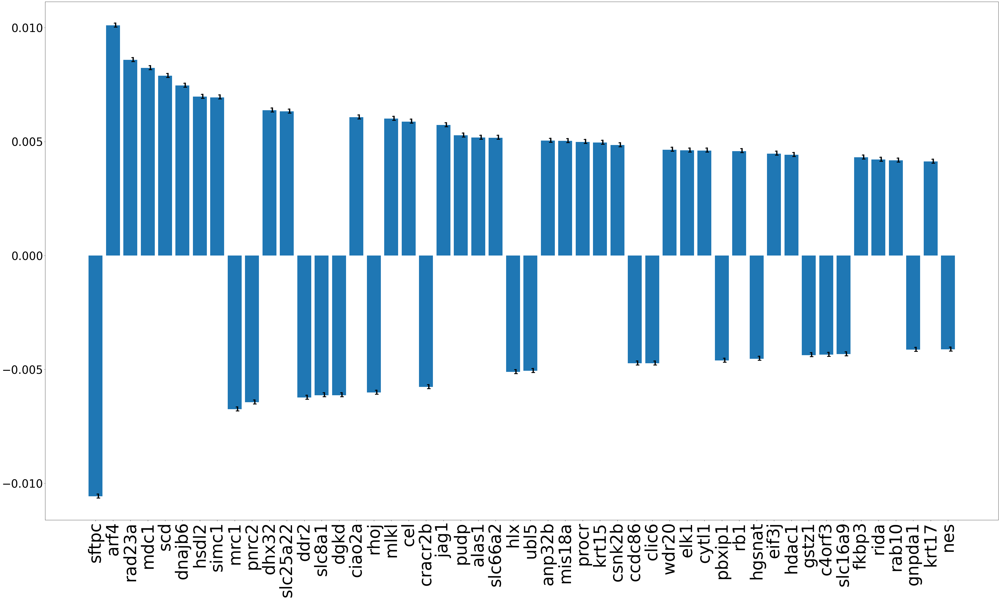

In [15]:
for experiment in os.listdir('data/cosmic_rads/vary_humans'):
    if experiment.endswith('.pkl'):
        print(experiment)
        merged_data_columns = pd.read_pickle('data/cosmic_rads/vary_humans/'+experiment).columns
        try:
            os.mkdir('results/cosmic_rads/vary_humans/'+experiment[:-4]+'/')
        except Exception as e:
            print(e)

        # define config
        config = {
            "name": "Example Experiment for AH casual ensemble",
            "short_name": "ah_experiment_notebook",
            "bucket_project": "fdl-us-astronaut-health",
            "bucket_name": "ah_21_data",
            "bucket_path": "gs://ah_21_data",
            "verbose": verbose,
            "test_val_split": [0.1, 0.1],
            "per_variant_experiment": False,
            "data_options": {
                'synthetic_train_test_split' : False,
                'dataset_fp' : 'data/cosmic_rads/vary_humans/'+experiment,
                'output_data_regime' : output_data_regime,
                'subject_keys': 'Source Name',
                'targets': ['irradiated'], #['dose_Gy'],
                'predictors': list(data.columns[43:-4]),
                'environments': ['environment'],
                'exclude': ['organism', 'source', 'gender', 'age_years', 'timepoint_hr', 'dose_Gy', 'radiation', 'dataset','strain']
            },
            "feature_selection_options": {
                "max_features": 20,
                "verbose": verbose,
                "seed": 12,
                "variance_threshold" : 2, # actually std
            },
            "ensemble_options": {
                "models": ["IRM","LIRM"],#, "ICP",], # "DCF", "LIRM", "NLICP"],
                "LIRM" : {
                    "use_icp_initialization": False,
                    "verbose": verbose,
                    "n_iterations": 1000,
                    "seed": 0,
                    "lr": 0.001,
                    "cuda": False,
                    "output_data_regime" : output_data_regime,
                },
                "DCF" : {
                    "minP": 0.1,
                    "maxP": 0.9,
                    "minFeatures": 1,
                    "minAccuracy": 0.5,
                    "seed": 0,
                    "verbose": verbose,
                    "target": ["Target"],
                    "output_pvals": False,
                    "output_data_regime" : output_data_regime,
                },
                "NLICP" : {
                    "max_set_size": 2,
                    "alpha": 0.05,
                    "seed": 12,
                    "verbose": verbose,
                    "method": "MLP",
                    "hidden_dim": 256,
                    "output_data_regime" : output_data_regime,
                },
                "LICP" : {
                    "max_set_size": 2,
                    "alpha": 0.05,
                    "seed": 12,
                    "verbose": verbose,
                    "output_data_regime" : output_data_regime,
                },
            },
             "use_cloud":False,
            "results_directory": "results/cosmic_rads/vary_humans/"+experiment[:-4]+'/'
            }
        print(config['results_directory'])
        run(config)